In [11]:
import numpy as np
import pandas as pd
import nltk
from nltk.sentiment import SentimentIntensityAnalyzer
from textblob import TextBlob
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.feature_extraction import _stop_words

In [12]:
reddit_df = pd.read_csv("Cleaned_dataset.csv")

In [13]:
reddit_df.head()

,Unnamed: 0,ID,Timestamp,Upvotes,Comments,URL,Cleaned_Title,Cleaned_Content,Combined_Text
0,0,1ojqij0,1.761799e+09,1,0,/r/depression/comments/1ojqij0/need_help/,need help,hi someone talk im thinking ending life wrote ...,need help hi someone talk im thinking ending l...
1,1,1ojqi6n,1.761799e+09,1,0,/r/depression/comments/1ojqi6n/depression_puni...,depression punishes twice,friends incident caused become seriously depre...,depression punishes twice friends incident cau...
2,2,1ojqem4,1.761798e+09,1,0,/r/depression/comments/1ojqem4/will_someone_li...,someone listen,im beginning year lost grandma like best frien...,someone listen im beginning year lost grandma ...
3,3,1ojpxzi,1.761797e+09,1,0,/r/depression/comments/1ojpxzi/think_about_dyi...,think dying every day,basically every night often day well think dyi...,think dying every day basically every night of...
4,4,1ojp7f1,1.761795e+09,3,2,/r/depression/comments/1ojp7f1/mind_blank_need...,mind blank need help ptsd,hi im say ive never told anyone thought anyone...,mind blank need help ptsd hi im say ive never ...


In [14]:
nltk.download("vader_lexicon")
sia = SentimentIntensityAnalyzer()

[nltk_data] Downloading package vader_lexicon to /root/nltk_data...
[nltk_data]   Package vader_lexicon is already up-to-date!


In [15]:
reddit_df["Combined_Text"] = reddit_df["Cleaned_Title"]  + " " + reddit_df["Cleaned_Content"]
reddit_df["Combined_Text"] = reddit_df["Combined_Text"].fillna("").astype(str)
def get_vader_sentiment(text):
    score = sia.polarity_scores(text)["compound"]
    if score > 0.2:
        return "Positive"
    elif score < -0.2:
        return "Negative"
    else:
        return "Neutral"

reddit_df["Sentiment"] = reddit_df["Combined_Text"].apply(get_vader_sentiment)

tfidf = TfidfVectorizer(max_features=1000, stop_words="english", ngram_range=(1,2))
tfidf_matrix = tfidf.fit_transform(reddit_df["Combined_Text"])
feature_names = tfidf.get_feature_names_out()

tfidf_scores = pd.DataFrame(tfidf_matrix.toarray(), columns=feature_names)
Important_Terms = tfidf_scores.mean().sort_values(ascending=False)[:20].index.tolist()

def classify_risk(text, sentiment):
    text = text.lower()
    high_risk_terms = ["suicide","suicidal", "kill myself", "end it", "i give up", "overdose", "goodbye", "can't go on", "commit suicide", "die", "kill", "attempt","ending life", "end life"]
    moderate_risk_terms = ["depressed", "addiction", "rehab", "cannabis", "molly", "heroin", "marijuana", "fentanyl", "pot", "hopeless", "numb", "empty", "need help", "worthless", "anxious", "panic attack", "im high", "drug"]


    if sentiment == "Negative" or sentiment=="Neutral":
        if any(term in text for term in high_risk_terms):
            return "High-Risk"
        elif any(term in text for term in moderate_risk_terms):
            return "Moderate Concern"

    return "Low Concern"

reddit_df["Risk_Level"] = reddit_df.apply(lambda row: classify_risk(row["Combined_Text"], row["Sentiment"]), axis=1)

/tmp/ipython-input-4259893601.py:4: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=sentiment_counts.index, y=sentiment_counts.values, palette={"Positive": "green", "Neutral": "gray", "Negative": "red"})


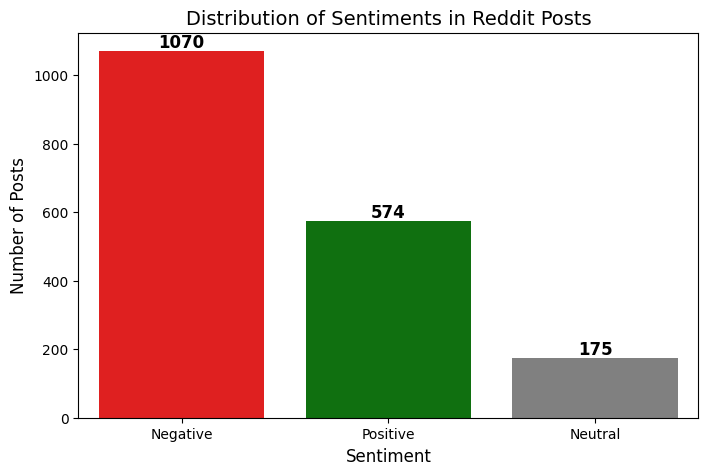

In [16]:
sentiment_counts = reddit_df["Sentiment"].value_counts()

plt.figure(figsize=(8, 5))
sns.barplot(x=sentiment_counts.index, y=sentiment_counts.values, palette={"Positive": "green", "Neutral": "gray", "Negative": "red"})

plt.xlabel("Sentiment", fontsize=12)
plt.ylabel("Number of Posts", fontsize=12)
plt.title("Distribution of Sentiments in Reddit Posts", fontsize=14)
plt.xticks(fontsize=10)
plt.yticks(fontsize=10)

for index, value in enumerate(sentiment_counts.values):
    plt.text(index, value + 10, str(value), ha="center", fontsize=12, fontweight="bold")

plt.show()

/tmp/ipython-input-2300412154.py:4: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=risk_counts.index, y=risk_counts.values, palette={"Low Concern": "green", "Moderate Concern": "gray", "High-Risk": "red"})


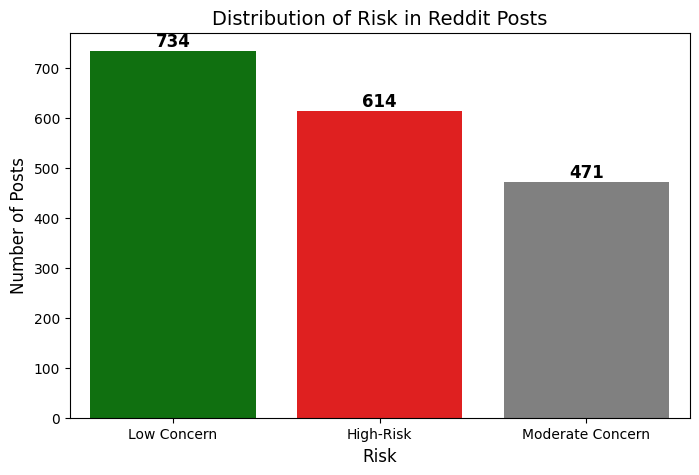

In [17]:
risk_counts = reddit_df["Risk_Level"].value_counts()

plt.figure(figsize=(8, 5))
sns.barplot(x=risk_counts.index, y=risk_counts.values, palette={"Low Concern": "green", "Moderate Concern": "gray", "High-Risk": "red"})

plt.xlabel("Risk", fontsize=12)
plt.ylabel("Number of Posts", fontsize=12)
plt.title("Distribution of Risk in Reddit Posts", fontsize=14)
plt.xticks(fontsize=10)
plt.yticks(fontsize=10)

for index, value in enumerate(risk_counts.values):
    plt.text(index, value + 10, str(value), ha="center", fontsize=12, fontweight="bold")

plt.show()

In [18]:
temp = reddit_df["Risk_Level"] == "Moderate Concern"
temp = reddit_df[temp]
temp = temp["Combined_Text"]
temp

,Combined_Text
3,think dying every day basically every night of...
5,loneliness hurts sucks one around people time ...
6,tired ive diagnosed chronic migraines making d...
8,depression yr old burnt college student im alw...
16,feel lost ngl im shouldnt badly depressed im s...
...,...
1773,hate beautiful nature idk saw beautiful sun se...
1802,one saddest ppl months ive dealt debilitating ...
1806,need help year old male living alone alone lif...
1808,hate much attachment since child always anxiou...


In [19]:
pd.set_option("display.max_rows", None)
pd.set_option("display.max_columns", None)
pd.set_option("display.expand_frame_repr", False)
pd.set_option("display.max_colwidth", None)

In [20]:
negative_texts = reddit_df[reddit_df["Sentiment"].isin(["Negative", "Neutral"])]["Combined_Text"]
high_risk_texts = reddit_df[reddit_df["Risk_Level"] == "High-Risk"]["Combined_Text"]
moderate_risk_texts = reddit_df[reddit_df["Risk_Level"]=="Moderate Concern"]["Combined_Text"]


In [21]:

tfidf_high = TfidfVectorizer(
    max_features=500,
    stop_words="english",
    ngram_range=(1, 2),
    min_df=3,
    max_df=0.8

)
tfidf_moderate = TfidfVectorizer(
    max_features=500,
    stop_words="english",
    ngram_range=(1, 2),
    min_df=3,
    max_df=0.8

)
tfidf_high.fit(negative_texts)
tfidf_moderate.fit(negative_texts)
tfidf_matrix_high = tfidf_high.transform(high_risk_texts)
tfidf_matrix_moderate = tfidf_moderate.transform(moderate_risk_texts)
feature_names_high = tfidf_high.get_feature_names_out()
feature_names_moderate = tfidf_moderate.get_feature_names_out()

tfidf_scores_high = pd.DataFrame(tfidf_matrix_high.toarray(), columns=feature_names_high)
tfidf_scores_moderate = pd.DataFrame(tfidf_matrix_moderate.toarray(), columns=feature_names_moderate)
important_terms_high = tfidf_scores_high.mean().sort_values(ascending=False)[:30].index.tolist()
important_terms_moderate = tfidf_scores_moderate.mean().sort_values(ascending=False)[:30].index.tolist()

print(f"High risk terms:{important_terms_high}\n")
print(f"Moderate risk terms:{important_terms_moderate}")


High risk terms:['im', 'dont', 'like', 'want', 'feel', 'life', 'ive', 'know', 'die', 'suicidal', 'time', 'really', 'people', 'think', 'years', 'want die', 'dont know', 'feel like', 'dont want', 'anymore', 'things', 'hate', 'thoughts', 'going', 'day', 'help', 'got', 'kill', 'make', 'friends']

Moderate risk terms:['im', 'feel', 'dont', 'like', 'ive', 'addiction', 'know', 'want', 'time', 'life', 'depressed', 'really', 'help', 'day', 'people', 'need', 'years', 'dont know', 'feeling', 'feel like', 'going', 'depression', 'things', 'think', 'bad', 'stop', 'way', 'got', 'work', 'anymore']


In [22]:
generic_words=[]
for i in important_terms_high:
  if i in Important_Terms:
    generic_words.append(i)


for i in important_terms_moderate:
  if i in Important_Terms:
    generic_words.append(i)

generic_words

['im',
 'dont',
 'like',
 'want',
 'feel',
 'life',
 'ive',
 'know',
 'time',
 'really',
 'people',
 'think',
 'years',
 'dont know',
 'feel like',
 'things',
 'day',
 'help',
 'im',
 'feel',
 'dont',
 'like',
 'ive',
 'addiction',
 'know',
 'want',
 'time',
 'life',
 'really',
 'help',
 'day',
 'people',
 'need',
 'years',
 'dont know',
 'feel like',
 'things',
 'think']

In [23]:
custom_stopwords = set(_stop_words.ENGLISH_STOP_WORDS).union(generic_words)
custom_stopwords = list(custom_stopwords)
tfidf_new_high = TfidfVectorizer(
    max_features=500,
    stop_words=custom_stopwords,
    ngram_range=(1, 2),
    min_df=3,
    max_df=0.8 )
tfidf_new_moderate = TfidfVectorizer(
    max_features=500,
    stop_words=custom_stopwords,
    ngram_range=(1, 2),
    min_df=3,
    max_df=0.8 )
tfidf_new_high.fit(negative_texts)
tfidf_new_moderate.fit(negative_texts)
tfidf_matrix_new_high = tfidf_new_high.transform(high_risk_texts)
tfidf_matrix_new_moderate = tfidf_new_moderate.transform(moderate_risk_texts)
feature_names_new_high = tfidf_new_high.get_feature_names_out()
feature_names_new_moderate = tfidf_new_moderate.get_feature_names_out()


tfidf_scores_new_high = pd.DataFrame(tfidf_matrix_new_high.toarray(), columns=feature_names_new_high)
tfidf_scores_new_moderate = pd.DataFrame(tfidf_matrix_new_moderate.toarray(), columns=feature_names_new_moderate)
important_terms_new_high = tfidf_scores_new_high.mean().sort_values(ascending=False)[:150].index.tolist()
important_terms_new_moderate = tfidf_scores_new_moderate.mean().sort_values(ascending=False)[:150].index.tolist()

print("Refined High-Risk Terms:", important_terms_new_high)
print("\n")
print("Refined Moderate-Risk Terms:", important_terms_new_moderate)

Refined High-Risk Terms: ['die', 'suicidal', 'anymore', 'going', 'hate', 'thoughts', 'kill', 'friends', 'make', 'got', 'way', 'family', 'end', 'suicide', 'better', 'fucking', 'bad', 'didnt', 'live', 'tired', 'tried', 'work', 'year', 'right', 'getting', 'ill', 'worse', 'feeling', 'school', 'lost', 'scared', 'point', 'good', 'feels', 'depressed', 'try', 'long', 'depression', 'suicidal thoughts', 'care', 'away', 'thinking', 'pain', 'tell', 'person', 'wanted', 'parents', 'started', 'talk', 'felt', 'told', 'thought', 'love', 'doesnt', 'stop', 'lot', 'ago', 'living', 'thing', 'trying', 'makes', 'job', 'months', 'say', 'death', 'mom', 'happy', 'times', 'days', 'gonna', 'hope', 'wish', 'hard', 'id', 'friend', 'reason', 'thats', 'maybe', 'night', 'sleep', 'hurt', 'shit', 'wanna', 'week', 'actually', 'attempt', 'mind', 'home', 'old', 'hes', 'dad', 'killing', 'health', 'money', 'used', 'said', 'went', 'wont', 'world', 'real', 'idk', 'therapy', 'probably', 'anxiety', 'self', 'mental', 'hours', 'li

In [24]:
distinct_high_risk_terms = list(set(important_terms_new_high) - set(important_terms_new_moderate))
print("Distinct High-Risk Terms:", distinct_high_risk_terms)

Distinct High-Risk Terms: ['literally', 'kind', 'suicidal', 'hurt', 'therapist', 'genuinely', 'understand', 'dad', 'finally', 'weeks', 'death', 'left', 'wasnt', 'die', 'meds', 'wanna', 'gonna', 'whats', 'hes', 'died', 'hospital', 'remember', 'attempt', 'suicidal thoughts', 'fuck', 'suicide', 'id', 'issues', 'honestly', 'everyday', 'probably', 'friend', 'happened', 'hours', 'kill', 'best', 'sure', 'look', 'stupid', 'wouldnt', 'killing', 'care']


In [25]:
distinct_moderate_risk_terms = list(set(important_terms_new_moderate) - set(important_terms_new_high))
print("Distinct moderate-Risk Terms:", distinct_moderate_risk_terms)

Distinct moderate-Risk Terms: ['smoking', 'problem', 'smoke', 'head', 'medication', 'drugs', 'fear', 'mg', 'drinking', 'social', 'quit', 'working', 'stuff', 'rehab', 'drug', 'anxious', 'ask', 'porn', 'alcohol', 'normal', 'numb', 'come', 'addict', 'sober', 'post', 'today', 'looking', 'use', 'addicted', 'worst', 'different', 'new', 'shes', 'mental health', 'bed', 'panic', 'weed', 'losing', 'place', 'relapse', 'body', 'completely']


In [26]:
from sklearn.feature_extraction.text import ENGLISH_STOP_WORDS

def filter_generic_words(word_list, additional_stopwords=None):
    """
    Removes generic words (stopwords, common Reddit terms, etc.) from a given word list.

    Args:
        word_list (list): List of words to filter.
        additional_stopwords (set): Optional additional words to remove.

    Returns:
        list: Filtered list with generic words removed.
    """

    reddit_stopwords = {"post", "deleted", "edit", "comments", "account", "people", "really",
                        "like", "just", "know", "think", "said", "man", "going","ok","tells", "asked","us","want","human", "im", "dont"}


    stopword_set = ENGLISH_STOP_WORDS.union(reddit_stopwords)
    if additional_stopwords:
        stopword_set = stopword_set.union(additional_stopwords)


    filtered_words = [word for word in word_list if word.lower() not in stopword_set]

    return filtered_words

In [27]:
negative_texts

,Combined_Text
1,depression punishes twice friends incident caused become seriously depressed incident occurred midjune mental health worsened months turns much stress body activates defense mechanism altering perception environment protect called derealizationdepersonalization dissociative disorders due stress anxiety depersonalization feel body belong aware something wrong believe body moves automatically furthermore people recognize look mirror begin see third person derealization characterized perception environment unreal dream people describe watching movie seeing life glass experience felt terror common scenarios life became strange unreal unknown last hours days weeks years possibility without treatment symptoms may reduced also possibility happen become chronic problem finally also possible severe depression triggers psychotic episode even people genetic predisposition said disorder nothing say sadbutrelievedface something one tells us get depressed knew beginning consequences would probably everything possible improve look know careful issues know depression makes many people wish longer alive thats sad happens cant measure really want im getting feel overwhelmed easy think worst still something even minimal brightens days something appreciate friends affected take care mental health already saw examples gave cryingcat invite search topics corroborate information looking since entered episode unreality honestly would liked continue crying every day playing guitar room today im worried scared would like one ever go say goodbye saying respect body mind take care signals send mind
3,think dying every day basically every night often day well think dying im transgender im closet job home living parents dont really know exist trans person makes want give feel disgusted body im scared way world seems trending terms trans acceptance basically fact youre much less likely hired trans person im terrified quit job simultaneously scared come work since know majority coworkers understand best actively hostile worst plus customer service seems like hell like even get better job anyways dropped highschool depressed anxious couldnt keep going anymore ive never anyone interested romantically granted probably ive depressed whole life spent teenage years repressing really knowledge trans pool people id even chance attracting basically slashed small handful majority creeps fetish know shouldnt really matter feel lonely kind know deep im going alone forever spend time wondering trans much happier would normal wish could go sleep never wake
4,mind blank need help ptsd hi im say ive never told anyone thought anyone gone something similar wouldnt mind hearing help im yo school abit bad kid around bad people environment heart always pure im bad person ever tried best friend got situation family threatened called help fight people threatening long story short met people fight whole different group people younger us went group one people told told young around leave area threat sincere serious situation turned around tell friend aint right guy kids even though one moment saying friend yo boy didnt know time later found guy threatening friend younger brother ran around toward friend happened next changed life forever friend pulled weapon ended fatally hurting boy fighting remember seeing boys organs dying front friend life prison ever since ive multiple attempts life hasnt happened many years completely wired brain dont talk unless spoken cant go anywhere cant see everyone around anytime see blood etc im close throwing deal remorse didnt kid listen mind forever blank emotions im weird everyone normal never trust fly wonder im never going even move
5,loneliness hurts sucks one around people time friends family theyre great wish could open someone anyone im ill feel guilty like burden dont want one person know feel dont think theyll know dont want bear weight dont like carrying much weight either feel like ive grown fast feelings anyone know handl

In [28]:
from sklearn.feature_selection import chi2
import numpy as np

tfidf_shared = TfidfVectorizer(
    max_features=3000,
    stop_words="english",
    ngram_range=(1, 2),
    min_df=3,
    max_df=0.8
)
negative_df = reddit_df[reddit_df["Sentiment"].isin(["Negative", "Neutral"])]

X_combined = tfidf_shared.fit_transform(negative_texts)
y_combined = (negative_df["Risk_Level"] == "High-Risk").astype(int)

chi2_scores, p_values = chi2(X_combined, y_combined)
feature_names = tfidf_shared.get_feature_names_out()
top_chi2_indices = np.argsort(chi2_scores)[::-1][:60]
top_chi2_words = feature_names[top_chi2_indices]

significant_words = [word for i, word in enumerate(top_chi2_words) if p_values[top_chi2_indices[i]] < 0.25]
print("**Top High-Risk Indicator Words by Chi-Square Test (Filtered):**")
print(filter_generic_words(significant_words, additional_stopwords=None))

**Top High-Risk Indicator Words by Chi-Square Test (Filtered):**
['die', 'suicidal', 'want die', 'kill', 'suicide', 'suicidal thoughts', 'attempt', 'killing', 'addiction', 'died', 'death', 'die dont', 'end life', 'dont want', 'im suicidal', 'attempted', 'attempts', 'thoughts', 'ive suicidal', 'tried', 'killed', 'want kill', 'overdose', 'suicidal ideation', 'gonna', 'die im', 'care', 'life', 'ideation', 'addicted', 'born', 'kill im', 'want end', 'commit', 'im tired', 'commit suicide', 'tried kill', 'th', 'wanna', 'wondering', 'sex', 'od', 'dad', 'rehab', 'im miserable', 'option', 'suicidal im', 'sobriety', 'feel suicidal', 'friend', 'supposed', 'kills', 'withdrawal', 'worth', 'wanted', 'care anymore', 'save']


In [29]:
tfidf_shared_moderate = TfidfVectorizer(
    max_features=3000,
    stop_words="english",
    ngram_range=(1, 2),
    min_df=0.0,
    max_df=0.8
)


X_combined_moderate = tfidf_shared_moderate.fit_transform(reddit_df["Combined_Text"])
y_combined_moderate = (reddit_df["Risk_Level"] == "Moderate Concern").astype(int)

chi2_scores_moderate, p_values_moderate = chi2(X_combined_moderate, y_combined_moderate)
feature_names_moderate = tfidf_shared_moderate.get_feature_names_out()
top_chi2_indices_moderate = np.argsort(chi2_scores_moderate)[::-1][:60]
top_chi2_words_moderate = feature_names_moderate[top_chi2_indices_moderate]

significant_words_moderate = [word for i, word in enumerate(top_chi2_words_moderate) if p_values_moderate[top_chi2_indices_moderate[i]] < 0.25]
print("**Top Moderate-Risk Indicator Words by Chi-Square Test (Filtered):**")
print(filter_generic_words(significant_words_moderate, additional_stopwords=significant_words))

**Top Moderate-Risk Indicator Words by Chi-Square Test (Filtered):**
['depressed', 'im depressed', 'need stop', 'anxious', 'feel sick', 'panic', 'depression', 'addiction im', 'oxycodone', 'panic attack', 'depressed im', 'halloween', 'anxiety', 'porn addiction', 'ive diagnosed', 'like anymore', 'smoke', 'best', 'noticed', 'society', 'love', 'circle', 'regret', 'gambling', 'choices', 'panic attacks', 'tomorrow']


In [31]:
pip install gensim

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 27.9/27.9 MB 64.1 MB/s eta 0:00:00


In [34]:
from gensim.models import Word2Vec
import nltk
nltk.download('punkt')
nltk.download('punkt_tab')

negative_texts["Tokenized"] = negative_texts.apply(lambda x: nltk.word_tokenize(x) if isinstance(x, str) else [])
moderate_risk_texts["Tokenized"] = moderate_risk_texts.apply(lambda x: nltk.word_tokenize(x) if isinstance(x, str) else [])
w2v_model = Word2Vec(sentences=negative_texts["Tokenized"], vector_size=100, window=5, min_count=3, workers=4)
w2v_model_moderate = Word2Vec(sentences=moderate_risk_texts["Tokenized"], vector_size=100, window=5, min_count=3, workers=4)

seed_words = filter_generic_words(significant_words)
seed_words_moderate = filter_generic_words(significant_words_moderate)
expanded_words = {}
expanded_words_moderate= {}
for word in seed_words:
    if word in w2v_model.wv:
        expanded_words[word] = filter_generic_words([w[0] for w in w2v_model.wv.most_similar(word, topn=10)], additional_stopwords=["simply","bring","knowing","continue","became","highschool","began","full","university","older","obviously","however","put","instead","check","name","true","writing","hobbies","fully","kinda","idk","point","normal","including","eventually"])

for word in seed_words_moderate:
    if word in w2v_model_moderate.wv:
        expanded_words_moderate[word] = filter_generic_words([w[0] for w in w2v_model_moderate.wv.most_similar(word, topn=10)], additional_stopwords=["simply","bring","knowing","continue","became","highschool","began","full","university","older","obviously","however","put","instead","check","name","true","writing","hobbies","fully","kinda","idk","point","normal","including","eventually"])
print("Expanded High-Risk Words:", expanded_words)
print("\n")
print("Expanded moderate-Risk Words:", expanded_words_moderate)

[nltk_data] Downloading package punkt to /root/nltk_data...
[nltk_data]   Package punkt is already up-to-date!
[nltk_data] Downloading package punkt_tab to /root/nltk_data...
[nltk_data]   Unzipping tokenizers/punkt_tab.zip.
/tmp/ipython-input-3142416666.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  negative_texts["Tokenized"] = negative_texts.apply(lambda x: nltk.word_tokenize(x) if isinstance(x, str) else [])
/tmp/ipython-input-3142416666.py:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  moderate_risk_texts["Tokenized"] = moderate_risk_texts.apply(lambda x: nltk.word_tokenize(x) if isinstance(x, str) else [])

Expanded High-Risk Words: {'die': ['anymore', 'feel', 'live'], 'suicidal': ['struggling', 'severe', 'recently', 'lot', 'gotten', 'thoughts', 'multiple', 'selfharm', 'intrusive', 'depressive'], 'kill': ['end', 'ill', 'burden', 'make', 'wish', 'theres', 'alive'], 'suicide': ['remember', 'low', 'big', 'shes', 'constant', 'hit', 'oh', 'porn'], 'attempt': ['use', 'drink', 'wife', 'emotional', 'oh', 'kids', 'hes', 'buy'], 'killing': ['looking', 'longer', 'horrible', 'able', 'brain', 'isnt', 'wouldnt'], 'addiction': ['withdrawal', 'addict', 'deep', 'hi', 'problems', 'meds', 'problem'], 'died': ['used', 'using', 'spent', 'nearly', 'havent', 'father', 'childhood', 'new', 'college'], 'death': ['reason', 'leave', 'matter', 'god', 'thats', 'maybe', 'supposed', 'world', 'look'], 'attempted': ['used', 'different', 'intense', 'severe', 'died', 'medical'], 'attempts': ['died', 'cocaine', 'havent', 'nearly', 'age', 'turned', 'using', 'used', 'father'], 'thoughts': ['recently', 'disorder', 'episode', 'd

In [35]:
results = {}
for key_word, words in expanded_words.items():

    valid_words = [word for word in words if word in feature_names_new_high]

    if not valid_words:
        continue


    high_risk_scores = tfidf_scores_new_high[valid_words].mean()
    moderate_risk_scores = tfidf_scores_new_moderate[valid_words].mean()


    score_difference = (high_risk_scores - moderate_risk_scores).sort_values(ascending=False)


    X_high = tfidf_matrix_new_high.toarray()
    X_moderate = tfidf_matrix_new_moderate.toarray()

    y_high = np.ones(X_high.shape[0])
    y_moderate = np.zeros(X_moderate.shape[0])

    X_combined = np.vstack((X_high, X_moderate))
    y_combined = np.hstack((y_high, y_moderate))

    chi2_scores, p_values = chi2(X_combined, y_combined)


    word_chi2_scores = {word: chi2_scores[np.where(feature_names_new_high == word)[0][0]]
                        for word in valid_words}


    results[key_word] = {
        "valid_words": valid_words,
        "score_difference": score_difference.to_dict(),
        "chi2_scores": word_chi2_scores
    }


df_results = pd.DataFrame.from_dict(results, orient='index')


print(df_results)

                                                                        valid_words                                                                                                                                                                                                                                                                                                                score_difference                                                                                                                                                                                                                                                                                                chi2_scores
die                                                                 [anymore, live]                                                                                                                                                                                                                      

In [36]:
df_results.shape
df_results.iloc[10]

,attempts
valid_words,"[died, havent, nearly, age, turned, using, used, father]"
score_difference,"{'died': 0.01376802029196329, 'age': 0.0065150838025468975, 'havent': 0.0008797857803215983, 'turned': 0.0004492282876383787, 'father': 0.00032549975339016875, 'using': -0.0016838248421170215, 'used': -0.0018172841881033582, 'nearly': -0.003785514172868964}"
chi2_scores,"{'died': 6.484737557514706, 'havent': 0.01614810913401499, 'nearly': 0.6459621203069692, 'age': 1.457379516452408, 'turned': 0.00841864158151348, 'using': 0.0915039954735799, 'used': 0.051366261899063494, 'father': 0.0041433226681642}"


In [37]:
chi2_values_00000 =df_results["chi2_scores"].apply(lambda x: np.mean(list(x.values())) if x else 0)

print(chi2_values_00000)

die           1.140817
suicidal      0.527362
kill          0.765116
suicide       0.649159
attempt       0.303423
killing       0.512149
addiction     0.563678
died          0.122488
death         0.471398
attempted     1.510009
attempts      1.094957
thoughts      0.388180
tried         0.679268
killed        2.083100
overdose      0.880209
care          0.564142
life          0.393408
ideation      2.208249
addicted      0.262507
born          0.217398
commit        0.278734
th            1.022352
wondering     0.429001
sex           0.504389
od            2.308237
dad           0.406424
rehab         0.363205
option        0.372749
sobriety      0.188708
friend        0.247117
supposed      0.869521
kills         0.094085
withdrawal    0.420751
worth         0.190141
wanted        0.440712
save          0.284205
Name: chi2_scores, dtype: float64


In [38]:
threshold_chi2 = 1

for key in df_results.index:
    valid_words = df_results.at[key, "valid_words"]
    chi2_scores = df_results.at[key, "chi2_scores"]
    score_diff = df_results.at[key, "score_difference"]

    filtered_words = [
        word for word in valid_words
        if chi2_scores.get(word, 0) >= threshold_chi2 and score_diff.get(word, 0) > 0
    ]

    filtered_chi2 = {word: chi2_scores[word] for word in filtered_words}
    filtered_score_diff = {word: score_diff[word] for word in filtered_words}

    df_results.at[key, "valid_words"] = filtered_words
    df_results.at[key, "chi2_scores"] = filtered_chi2
    df_results.at[key, "score_difference"] = filtered_score_diff

In [39]:
df_results

,valid_words,score_difference,chi2_scores
die,[live],{'live': 0.01161173148305851},{'live': 1.6033826586953617}
suicidal,[thoughts],{'thoughts': 0.01609449736969594},{'thoughts': 2.6243255190820243}
kill,"[end, burden]","{'end': 0.01362509981780512, 'burden': 0.005850664992414572}","{'end': 2.166912970526954, 'burden': 1.431359995180975}"
suicide,[],{},{}
attempt,[],{},{}
killing,[horrible],{'horrible': 0.005681984098334795},{'horrible': 1.0014888103106623}
addiction,[],{},{}
died,[],{},{}
death,[supposed],{'supposed': 0.006926618058267928},{'supposed': 1.756976090974169}
attempted,[died],{'died': 0.01376802029196329},{'died': 6.484737557514706}


In [40]:
chi2_values_ = df_results["chi2_scores"].apply(lambda x: np.mean(list(x.values())) if x else 0)

print(chi2_values_)

die            1.603383
suicidal       2.624326
kill           1.799136
suicide        0.000000
attempt        0.000000
killing        1.001489
addiction      0.000000
died           0.000000
death          1.756976
attempted      6.484738
attempts       3.971059
thoughts       0.000000
tried          1.654280
killed        13.352262
overdose       0.000000
care           1.410062
life           1.431360
ideation      13.352262
addicted       0.000000
born           0.000000
commit         0.000000
th             6.484738
wondering      1.239737
sex            0.000000
od            13.352262
dad            1.315320
rehab          0.000000
option         0.000000
sobriety       0.000000
friend         0.000000
supposed       5.245750
kills          0.000000
withdrawal     0.000000
worth          0.000000
wanted         1.233198
save           0.000000
Name: chi2_scores, dtype: float64


In [41]:
filtered_chi2_values = chi2_values_[chi2_values_ > 0]
print(filtered_chi2_values)

die           1.603383
suicidal      2.624326
kill          1.799136
killing       1.001489
death         1.756976
attempted     6.484738
attempts      3.971059
tried         1.654280
killed       13.352262
care          1.410062
life          1.431360
ideation     13.352262
th            6.484738
wondering     1.239737
od           13.352262
dad           1.315320
supposed      5.245750
wanted        1.233198
Name: chi2_scores, dtype: float64


In [42]:
filtered_rows = df_results.loc[chi2_values_ > 0]
High_risk_valid_words_dict = {}

for key in filtered_rows.index:
    valid_words = df_results.at[key, "valid_words"]
    High_risk_valid_words_dict[key] = valid_words

print(High_risk_valid_words_dict)

{'die': ['live'], 'suicidal': ['thoughts'], 'kill': ['end', 'burden'], 'killing': ['horrible'], 'death': ['supposed'], 'attempted': ['died'], 'attempts': ['died', 'age'], 'tried': ['hospital'], 'killed': ['suicide'], 'care': ['tell', 'hurt'], 'life': ['burden'], 'ideation': ['suicide'], 'th': ['died'], 'wondering': ['fact'], 'od': ['suicide'], 'dad': ['mother'], 'supposed': ['death'], 'wanted': ['id']}


In [43]:
results_moderate = {}
for key_word, words in expanded_words_moderate.items():

    valid_words = [word for word in words if word in feature_names_new_moderate]

    if not valid_words:
        continue


    high_risk_scores = tfidf_scores_new_high[valid_words].mean()
    moderate_risk_scores = tfidf_scores_new_moderate[valid_words].mean()


    score_difference = (moderate_risk_scores - high_risk_scores).sort_values(ascending=False)


    X_high = tfidf_matrix_new_high.toarray()
    X_moderate = tfidf_matrix_new_moderate.toarray()

    y_high = np.zeros(X_high.shape[0])
    y_moderate = np.ones(X_moderate.shape[0])

    X_combined = np.vstack((X_moderate, X_high))
    y_combined = np.hstack((y_moderate, y_high))

    chi2_scores, p_values = chi2(X_combined, y_combined)


    word_chi2_scores = {word: chi2_scores[np.where(feature_names_new_moderate == word)[0][0]]
                        for word in valid_words}


    results_moderate[key_word] = {
        "valid_words": valid_words,
        "score_difference": score_difference.to_dict(),
        "chi2_scores": word_chi2_scores
    }


df_results_moderate = pd.DataFrame.from_dict(results_moderate, orient='index')


print(df_results_moderate)

                                                               valid_words                                                                                                                                                                                                                                                                                score_difference                                                                                                                                                                                                                                                                     chi2_scores
depressed                              [work, family, thought, way, brain]                                                                                                                               {'brain': 0.0036386661711198497, 'work': -9.03621097675042e-06, 'way': -0.0017067077007173435, 'thought': -0.005777379626477928, 'family': -0.006015294293442268}   

In [44]:
df_results_moderate.shape
df_results_moderate.iloc[10]

,friend
valid_words,"[days, thats, pain]"
score_difference,"{'days': 0.004436783668372402, 'thats': -0.004045383483928862, 'pain': -0.005032543816997196}"
chi2_scores,"{'days': 0.2580733729414986, 'thats': 0.2743381111612244, 'pain': 0.32978505417169157}"


In [45]:
chi2_values_000 =df_results_moderate["chi2_scores"].apply(lambda x: np.mean(list(x.values())) if x else 0)

print(chi2_values_000)

depressed     0.221108
addiction     1.046742
wondering     0.505198
anxious       0.532514
panic         0.354212
depression    0.478987
oxycodone     0.451332
addicted      0.254323
halloween     0.753825
anxiety       0.347506
friend        0.287399
death         0.548369
smoke         0.098293
best          0.290073
noticed       0.495533
society       0.377636
love          0.293281
circle        0.521618
regret        0.365025
gambling      0.917220
care          0.448386
choices       0.537990
tomorrow      0.092716
Name: chi2_scores, dtype: float64


In [46]:
threshold_chi2 = 1

for key in df_results_moderate.index:
    valid_words = df_results_moderate.at[key, "valid_words"]
    chi2_scores = df_results_moderate.at[key, "chi2_scores"]
    score_diff = df_results_moderate.at[key, "score_difference"]

    filtered_words = [
        word for word in valid_words
        if chi2_scores.get(word, 0) >= threshold_chi2 and score_diff.get(word, 0) > 0
    ]

    filtered_chi2 = {word: chi2_scores[word] for word in filtered_words}
    filtered_score_diff = {word: score_diff[word] for word in filtered_words}

    df_results_moderate.at[key, "valid_words"] = filtered_words
    df_results_moderate.at[key, "chi2_scores"] = filtered_chi2
    df_results_moderate.at[key, "score_difference"] = filtered_score_diff

In [47]:
df_results_moderate

,valid_words,score_difference,chi2_scores
depressed,[],{},{}
addiction,[],{},{}
wondering,[],{},{}
anxious,[],{},{}
panic,[],{},{}
depression,[anxiety],{'anxiety': 0.01127340071439606},{'anxiety': 1.7109227315347706}
oxycodone,[drugs],{'drugs': 0.006609038544914709},{'drugs': 1.0978465345897992}
addicted,[],{},{}
halloween,[],{},{}
anxiety,[],{},{}


In [48]:
Moderate_Risk_words = df_results_moderate.index.tolist()
Moderate_Risk_words

['depressed',
 'addiction',
 'wondering',
 'anxious',
 'panic',
 'depression',
 'oxycodone',
 'addicted',
 'halloween',
 'anxiety',
 'friend',
 'death',
 'smoke',
 'best',
 'noticed',
 'society',
 'love',
 'circle',
 'regret',
 'gambling',
 'care',
 'choices',
 'tomorrow']

In [49]:
Moderate_Risk_Words_Final = ['panic','depressed','anxious','addiction','attacks','numb','ssris','thoughts','attack','derealization','triggered',
 'love','visa','anxiety','friend','best','live','lost','overwhelmed','test','realizing','care','highschool','stressed','life',
 'truly']

In [50]:
tfidf_vectorizer_bg_high = TfidfVectorizer(ngram_range=(2,3), max_features=100)
tfidf_matrix_bg_high = tfidf_vectorizer_bg_high.fit_transform(high_risk_texts)
feature_names_bg_high = tfidf_vectorizer_bg_high.get_feature_names_out()
tfidf_scores_bg_high = pd.DataFrame(tfidf_matrix_bg_high.toarray(), columns=feature_names_bg_high)
important_terms_bg_high = tfidf_scores_bg_high.mean().sort_values(ascending=False)[:30].index.tolist()



In [51]:
tfidf_scores_bg_high.columns

Index(['anymore im', 'anyone else', 'cant even', 'cant get', 'cant stop',
       'die dont', 'dont care', 'dont even', 'dont even know', 'dont feel',
       'dont know', 'dont know im', 'dont really', 'dont really know',
       'dont see', 'dont think', 'dont wanna', 'dont want', 'dont want die',
       'dont want live', 'end life', 'entire life', 'even know', 'even though',
       'ever since', 'every day', 'every single', 'every time', 'feel bad',
       'feel better', 'feel guilty', 'feel like', 'feel like im',
       'feeling like', 'feels like', 'felt like', 'first time', 'get better',
       'getting worse', 'go back', 'high school', 'im afraid', 'im done',
       'im even', 'im feeling', 'im fucking', 'im going', 'im gonna',
       'im really', 'im scared', 'im still', 'im suicidal', 'im sure',
       'im tired', 'im trying', 'ive always', 'ive ever', 'ive lost',
       'ive never', 'ive suicidal', 'ive tried', 'keep going', 'know anymore',
       'know im', 'last night', 'last 

In [52]:
tfidf_shared_bg = TfidfVectorizer(
    max_features=100,
    stop_words="english",
    ngram_range=(2, 3),
    min_df=3,
    max_df=0.8
)
negative_df = reddit_df[reddit_df["Sentiment"] == "Negative"]

X_combined_bg = tfidf_shared_bg.fit_transform(negative_df["Combined_Text"])
y_combined_bg = (negative_df["Risk_Level"] == "High-Risk").astype(int)

chi2_scores_bg, p_values_bg = chi2(X_combined_bg, y_combined_bg)
feature_names_bg = tfidf_shared_bg.get_feature_names_out()
top_chi2_indices_bg = np.argsort(chi2_scores_bg)[::-1][:60]
top_chi2_words_bg = feature_names_bg[top_chi2_indices_bg]

significant_words_bg = [word for i, word in enumerate(top_chi2_words_bg) if p_values_bg[top_chi2_indices_bg[i]] < 0.25]
print("**Top High-Risk Indicator Words by Chi-Square Test (Filtered):**")
print(significant_words_bg)

**Top High-Risk Indicator Words by Chi-Square Test (Filtered):**
['want die', 'suicidal thoughts', 'end life', 'die dont', 'want die dont', 'im depressed', 'need help', 'social media', 'im tired', 'anxiety depression', 'im fucking', 'panic attack', 'dont want', 'dont care', 'dont wanna', 'years old', 'self harm', 'want live', 'im gonna', 'know need', 'feel bad', 'dont think', 'know feel', 'im sick', 'dont understand']


In [53]:
high_risk_chi2_values = [
    (feature_names_bg[i], chi2_scores_bg[i])
    for i in top_chi2_indices_bg if p_values_bg[i] < 0.25
]

high_risk_chi2_values.sort(key=lambda x: x[1], reverse=True)

print("**Top 30 High-Risk Indicator Words with Chi-Square Scores:**")
for word, score in high_risk_chi2_values:
    print(f"{word}: {score:.4f}")

**Top 30 High-Risk Indicator Words with Chi-Square Scores:**
want die: 43.0606
suicidal thoughts: 35.3116
end life: 9.9050
die dont: 7.5373
want die dont: 7.3386
im depressed: 6.0110
need help: 3.4314
social media: 3.4166
im tired: 3.3797
anxiety depression: 3.1613
im fucking: 2.9421
panic attack: 2.9359
dont want: 2.9155
dont care: 2.8918
dont wanna: 2.7670
years old: 2.5672
self harm: 2.2597
want live: 2.2185
im gonna: 2.0372
know need: 1.8984
feel bad: 1.7661
dont think: 1.5838
know feel: 1.4576
im sick: 1.3495
dont understand: 1.3395


In [54]:
filtered_high_bg = [
    (word, score) for word, score in high_risk_chi2_values if score >= 4
]
filtered_high_bg

[('want die', np.float64(43.06057988038393)),
 ('suicidal thoughts', np.float64(35.31159535544892)),
 ('end life', np.float64(9.905029802022389)),
 ('die dont', np.float64(7.537312256583665)),
 ('want die dont', np.float64(7.338645910699032)),
 ('im depressed', np.float64(6.011045760194921))]

In [55]:
High_risk_crisis_terms = [word for word, score in filtered_high_bg]
print(High_risk_crisis_terms)

['want die', 'suicidal thoughts', 'end life', 'die dont', 'want die dont', 'im depressed']


In [56]:
for term in High_risk_crisis_terms:
    if term not in High_risk_valid_words_dict:
        High_risk_valid_words_dict[term] = []

print(High_risk_valid_words_dict)

{'die': ['live'], 'suicidal': ['thoughts'], 'kill': ['end', 'burden'], 'killing': ['horrible'], 'death': ['supposed'], 'attempted': ['died'], 'attempts': ['died', 'age'], 'tried': ['hospital'], 'killed': ['suicide'], 'care': ['tell', 'hurt'], 'life': ['burden'], 'ideation': ['suicide'], 'th': ['died'], 'wondering': ['fact'], 'od': ['suicide'], 'dad': ['mother'], 'supposed': ['death'], 'wanted': ['id'], 'want die': [], 'suicidal thoughts': [], 'end life': [], 'die dont': [], 'want die dont': [], 'im depressed': []}


In [57]:
dictionary_keys_list = list(High_risk_valid_words_dict.keys())
print(dictionary_keys_list)

['die', 'suicidal', 'kill', 'killing', 'death', 'attempted', 'attempts', 'tried', 'killed', 'care', 'life', 'ideation', 'th', 'wondering', 'od', 'dad', 'supposed', 'wanted', 'want die', 'suicidal thoughts', 'end life', 'die dont', 'want die dont', 'im depressed']


In [58]:
dictionary_keys_list = ['die', 'suicidal', 'kill', 'attempt', 'death', 'live fucking', 'fucking live', 'killed', 'commit', 'relapse','attempt', 'alive', 'suffer', 'overdose', 'kms', 'want die', 'suicidal thoughts', 'want kill', 'dont want live','panick attacks','panick attack' ]

In [59]:
def contains_high_risk_terms(text):
    text_lower = text.lower()
    return any(term in text_lower for term in dictionary_keys_list)

reddit_df_new = reddit_df.copy()

reddit_df_new["Risk_Adjusted"] = reddit_df_new["Risk_Level"]

mask = (reddit_df_new["Risk_Level"] == "Moderate Concern") & (reddit_df_new["Combined_Text"].apply(contains_high_risk_terms))
reddit_df_new.loc[mask, "Risk_Adjusted"] = "High-Risk"

print(f"Relabeled {mask.sum()} posts from 'Moderate Concern' to 'High-Risk'.")

Relabeled 96 posts from 'Moderate Concern' to 'High-Risk'.


In [60]:
relabeled_posts = reddit_df_new[mask]
print(relabeled_posts)

      Unnamed: 0       ID     Timestamp  Upvotes  Comments                                                                                  URL                                                                                                                                               Cleaned_Title                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                             

In [61]:
print(reddit_df_new["Risk_Adjusted"].value_counts())

Risk_Adjusted
Low Concern         734
High-Risk           710
Moderate Concern    375
Name: count, dtype: int64


In [62]:
from sklearn.decomposition import LatentDirichletAllocation


high_risk_df_new = reddit_df_new[reddit_df_new["Risk_Adjusted"] == "High-Risk"]
moderate_risk_df_new = reddit_df_new[reddit_df_new["Risk_Adjusted"] == "Moderate Concern"]


def apply_lda(texts, num_topics=5, max_features=1000):
    tfidf_vectorizer_new = TfidfVectorizer(
        max_features=max_features, stop_words="english", ngram_range=(1, 2), min_df=3, max_df=0.8
    )
    X_tfidf = tfidf_vectorizer_new.fit_transform(texts)

    lda = LatentDirichletAllocation(n_components=num_topics, random_state=42)
    lda.fit(X_tfidf)

    feature_names_new = tfidf_vectorizer_new.get_feature_names_out()

    return lda, tfidf_vectorizer_new, feature_names_new


lda_high, tfidf_vectorizer_high, feature_names_new_high = apply_lda(high_risk_df_new["Combined_Text"])
lda_moderate, tfidf_vectorizer_moderate, feature_names_new_moderate = apply_lda(moderate_risk_df_new["Combined_Text"])


def get_lda_features(model, texts, vectorizer):
    X_tfidf = vectorizer.transform(texts)
    return model.transform(X_tfidf)



def print_topics(model, feature_names_new, title, num_words=10):
    print(f"\n **{title}**")
    for topic_idx, topic in enumerate(model.components_):
        top_words = [feature_names_new[i] for i in topic.argsort()[:-num_words - 1:-1]]
        print(f"**Topic {topic_idx + 1}:** {', '.join(top_words)}")

print_topics(lda_high, feature_names_new_high, "High-Risk Topics")
print_topics(lda_moderate, feature_names_new_moderate, "Moderate-Risk Topics")


 **High-Risk Topics**
**Topic 1:** want die, die, want, anymore, hi, panic, badly, final, moments, title
**Topic 2:** want kill, plus, car, figure, pass, worry, want die, aa, moment, notice
**Topic 3:** worry, emotional, lose, anxious, losing, hit, got, want kill, plus, car
**Topic 4:** plus, car, moment, pass, figure, possible, normal, dont, want kill, worry
**Topic 5:** dont, like, feel, want, ive, life, know, time, really, people

 **Moderate-Risk Topics**
**Topic 1:** shame, wife, program, drop, gambling, music, sub, wondering, listening, rid
**Topic 2:** music, listening, dopamine, gives, stand, addiction ive, realized, needs, realize, sit
**Topic 3:** gambling, spending, blood, program, alot, hand, addiction, drop, staying, habit
**Topic 4:** im, feel, like, dont, ive, know, want, life, addiction, help
**Topic 5:** addiction, treatment, addicted, meth, guilt, wondering, rid, addiction ive, im addicted, read


In [63]:
X_lda_high = get_lda_features(lda_high, reddit_df_new[ "Combined_Text"], tfidf_vectorizer_high)
X_lda_moderate = get_lda_features(lda_moderate,  reddit_df_new["Combined_Text"], tfidf_vectorizer_moderate)

X_lda_combined = np.hstack((X_lda_high, X_lda_moderate))

In [64]:
import torch
print("Device:", torch.device("cuda" if torch.cuda.is_available() else "cpu"))
print("CUDA available:", torch.cuda.is_available())
print("GPU name:", torch.cuda.get_device_name(0) if torch.cuda.is_available() else "No GPU detected")


Device: cuda
CUDA available: True
GPU name: Tesla T4


In [65]:
import torch
from transformers import BertTokenizer, BertModel
from sklearn.preprocessing import MultiLabelBinarizer

tokenizer = BertTokenizer.from_pretrained("bert-base-uncased")
bert_model = BertModel.from_pretrained("bert-base-uncased")
bert_model.eval()

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

def get_bert_embeddings(texts, batch_size=32):
    bert_model.to(device)
    embeddings = []
    texts = [str(text) if isinstance(text, str) else "" for text in texts]

    for i in range(0, len(texts), batch_size):
        batch_texts = texts[i:i+batch_size]


        inputs = tokenizer(batch_texts, padding=True, truncation=True, max_length=512, return_tensors="pt")
        inputs = {key: val.to(device) for key, val in inputs.items()}

        with torch.no_grad():
            outputs = bert_model(**inputs)

        batch_embeddings = outputs.last_hidden_state[:, 0, :].cpu().numpy()  # Move back to CPU
        embeddings.append(batch_embeddings)

    return np.vstack(embeddings)

X_bert = get_bert_embeddings(reddit_df_new[ "Combined_Text"])

high_risk_terms = ['die', 'suicidal', 'kill', 'attempt', 'death', 'live fucking', 'fucking live', 'killed', 'commit', 'relapse', 'alive',
                   'suffer', 'overdose', 'kms', 'hurt', 'want die', 'suicidal thoughts', 'want kill', 'want live', 'panic attacks', 'panic attack']
moderate_risk_terms = Moderate_Risk_Words_Final

def risk_feature(texts, terms):
    features = []
    for text in texts:
        features.append([1 if term in text.lower() else 0 for term in terms])
    return np.array(features)


X_high_risk = risk_feature(reddit_df_new["Combined_Text"], high_risk_terms)
X_moderate_risk = risk_feature(reddit_df_new["Combined_Text"], moderate_risk_terms)

X_final = np.hstack((X_bert,X_high_risk, X_moderate_risk, X_lda_combined))

print("Feature matrix shape:", X_final.shape)

/usr/local/lib/python3.12/dist-packages/huggingface_hub/utils/_auth.py:94: UserWarning: 
The secret `HF_TOKEN` does not exist in your Colab secrets.
To authenticate with the Hugging Face Hub, create a token in your settings tab (https://huggingface.co/settings/tokens), set it as secret in your Google Colab and restart your session.
You will be able to reuse this secret in all of your notebooks.
Please note that authentication is recommended but still optional to access public models or datasets.
  warnings.warn(


tokenizer_config.json:   0%|          | 0.00/48.0 [00:00<?, ?B/s]

vocab.txt:   0%|          | 0.00/232k [00:00<?, ?B/s]

tokenizer.json:   0%|          | 0.00/466k [00:00<?, ?B/s]

config.json:   0%|          | 0.00/570 [00:00<?, ?B/s]

model.safetensors:   0%|          | 0.00/440M [00:00<?, ?B/s]

Feature matrix shape: (1819, 825)


In [66]:
reddit_df_new.columns

Index(['Unnamed: 0', 'ID', 'Timestamp', 'Upvotes', 'Comments', 'URL',
       'Cleaned_Title', 'Cleaned_Content', 'Combined_Text', 'Sentiment',
       'Risk_Level', 'Risk_Adjusted'],
      dtype='object')

In [67]:
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import LabelEncoder

label_encoder = LabelEncoder()
y_labels = label_encoder.fit_transform(reddit_df_new["Risk_Adjusted"])

X_train, X_test, y_train, y_test = train_test_split(X_final, y_labels, test_size=0.2, random_state=42)

print(f"Training Data: {X_train.shape}, Testing Data: {X_test.shape}")

Training Data: (1455, 825), Testing Data: (364, 825)


In [68]:
import torch.nn as nn
import torch.optim as optim
from sklearn.utils.class_weight import compute_class_weight

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

X_train_tensor = torch.tensor(X_train, dtype=torch.float32).to(device)
X_test_tensor = torch.tensor(X_test, dtype=torch.float32).to(device)
y_train_tensor = torch.tensor(y_train, dtype=torch.long).to(device)
y_test_tensor = torch.tensor(y_test, dtype=torch.long).to(device)

class RiskClassifier(nn.Module):
    def __init__(self, input_dim, hidden_dim, output_dim):
        super(RiskClassifier, self).__init__()

        self.fc1 = nn.Linear(input_dim, hidden_dim)
        self.batch_norm1 = nn.BatchNorm1d(hidden_dim)
        self.relu1 = nn.ReLU()
        self.dropout1 = nn.Dropout(0.3)

        self.fc2 = nn.Linear(hidden_dim, hidden_dim // 2)
        self.batch_norm2 = nn.BatchNorm1d(hidden_dim // 2)
        self.relu2 = nn.ReLU()
        self.dropout2 = nn.Dropout(0.3)

        self.fc3 = nn.Linear(hidden_dim // 2, hidden_dim // 4)
        self.batch_norm3 = nn.BatchNorm1d(hidden_dim // 4)
        self.relu3 = nn.ReLU()
        self.dropout3 = nn.Dropout(0.3)

        self.fc4 = nn.Linear(hidden_dim // 4, hidden_dim // 8)
        self.batch_norm4 = nn.BatchNorm1d(hidden_dim // 8)
        self.relu4 = nn.ReLU()
        self.dropout4 = nn.Dropout(0.3)

        self.fc5 = nn.Linear(hidden_dim // 8, output_dim)

    def forward(self, x):
        x = self.fc1(x)
        x = self.batch_norm1(x)
        x = self.relu1(x)
        x = self.dropout1(x)

        x = self.fc2(x)
        x = self.batch_norm2(x)
        x = self.relu2(x)
        x = self.dropout2(x)

        x = self.fc3(x)
        x = self.batch_norm3(x)
        x = self.relu3(x)
        x = self.dropout3(x)

        x = self.fc4(x)
        x = self.batch_norm4(x)
        x = self.relu4(x)
        x = self.dropout4(x)

        x = self.fc5(x)
        return x

input_dim = X_train.shape[1]
hidden_dim = 512
output_dim = len(label_encoder.classes_)

model = RiskClassifier(input_dim, hidden_dim, output_dim).to(device)

class_weights = compute_class_weight('balanced', classes=np.unique(y_train), y=y_train)
class_weights = torch.tensor(class_weights, dtype=torch.float32).to(device)

criterion = nn.CrossEntropyLoss(weight=class_weights)
optimizer = optim.Adam(model.parameters(), lr=0.001)

print(model)


RiskClassifier(
  (fc1): Linear(in_features=825, out_features=512, bias=True)
  (batch_norm1): BatchNorm1d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (relu1): ReLU()
  (dropout1): Dropout(p=0.3, inplace=False)
  (fc2): Linear(in_features=512, out_features=256, bias=True)
  (batch_norm2): BatchNorm1d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (relu2): ReLU()
  (dropout2): Dropout(p=0.3, inplace=False)
  (fc3): Linear(in_features=256, out_features=128, bias=True)
  (batch_norm3): BatchNorm1d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (relu3): ReLU()
  (dropout3): Dropout(p=0.3, inplace=False)
  (fc4): Linear(in_features=128, out_features=64, bias=True)
  (batch_norm4): BatchNorm1d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (relu4): ReLU()
  (dropout4): Dropout(p=0.3, inplace=False)
  (fc5): Linear(in_features=64, out_features=3, bias=True)
)


In [69]:
epochs = 20
batch_size = 32

for epoch in range(epochs):
    model.train()
    optimizer.zero_grad()

    outputs = model(X_train_tensor)
    loss = criterion(outputs, y_train_tensor)

    loss.backward()
    optimizer.step()

    print(f"Epoch [{epoch+1}/{epochs}], Loss: {loss.item():.4f}")

print("Training complete!")

Epoch [1/20], Loss: 1.1515
Epoch [2/20], Loss: 1.0740
Epoch [3/20], Loss: 1.0289
Epoch [4/20], Loss: 0.9954
Epoch [5/20], Loss: 0.9584
Epoch [6/20], Loss: 0.9286
Epoch [7/20], Loss: 0.8945
Epoch [8/20], Loss: 0.8544
Epoch [9/20], Loss: 0.8183
Epoch [10/20], Loss: 0.7739
Epoch [11/20], Loss: 0.7502
Epoch [12/20], Loss: 0.7181
Epoch [13/20], Loss: 0.6839
Epoch [14/20], Loss: 0.6433
Epoch [15/20], Loss: 0.6088
Epoch [16/20], Loss: 0.5865
Epoch [17/20], Loss: 0.5501
Epoch [18/20], Loss: 0.5103
Epoch [19/20], Loss: 0.4935
Epoch [20/20], Loss: 0.4693
Training complete!


In [70]:
from sklearn.metrics import accuracy_score, classification_report

model.eval()
with torch.no_grad():
    y_pred_test = model(X_test_tensor)
    y_pred_labels = torch.argmax(y_pred_test, dim=1).cpu().numpy()

accuracy = accuracy_score(y_test, y_pred_labels)
print(f"Test Accuracy: {accuracy:.4f}")

print(classification_report(y_test, y_pred_labels, target_names=label_encoder.classes_))

Test Accuracy: 0.6511
                  precision    recall  f1-score   support

       High-Risk       0.68      0.86      0.76       148
     Low Concern       0.67      0.50      0.57       141
Moderate Concern       0.54      0.51      0.52        75

        accuracy                           0.65       364
       macro avg       0.63      0.63      0.62       364
    weighted avg       0.65      0.65      0.64       364



In [71]:
import xgboost as xgb
from sklearn.metrics import classification_report

xgb_model = xgb.XGBClassifier(
    objective="multi:softmax",
    num_class=len(label_encoder.classes_),
    eval_metric="mlogloss",
    use_label_encoder=False,
    scale_pos_weight=[1, 1.1, 2],
    learning_rate=0.05,
    max_depth=6,
    n_estimators=500,
    subsample=0.8,
    colsample_bytree=0.8,
    random_state=42
)

xgb_model.fit(X_train, y_train)

y_pred = xgb_model.predict(X_test)

print(classification_report(y_test, y_pred, target_names=label_encoder.classes_))


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [15:43:54] WARNING: /workspace/src/learner.cc:790: 
Parameters: { "scale_pos_weight", "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


                  precision    recall  f1-score   support

       High-Risk       0.83      0.82      0.82       148
     Low Concern       0.63      0.69      0.66       141
Moderate Concern       0.54      0.45      0.49        75

        accuracy                           0.69       364
       macro avg       0.66      0.65      0.66       364
    weighted avg       0.69      0.69      0.69       364



In [72]:
import torch
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import Dataset, DataLoader
from transformers import DistilBertTokenizer, DistilBertModel


device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

tokenizer = DistilBertTokenizer.from_pretrained("distilbert-base-uncased")

class RedditDataset(Dataset):
    def __init__(self, texts, labels, tokenizer, max_length=512):
        self.texts = texts
        self.labels = labels
        self.tokenizer = tokenizer
        self.max_length = max_length

    def __len__(self):
        return len(self.texts)

    def __getitem__(self, idx):
        encoding = self.tokenizer(
            self.texts[idx],
            padding="max_length",
            truncation=True,
            max_length=self.max_length,
            return_tensors="pt",
        )

        input_ids = encoding["input_ids"].squeeze(0)
        attention_mask = encoding["attention_mask"].squeeze(0)
        label = torch.tensor(self.labels[idx], dtype=torch.long)

        return {"input_ids": input_ids, "attention_mask": attention_mask, "label": label}


train_texts, test_texts, y_train, y_test = train_test_split(
    reddit_df_new["Combined_Text"].tolist(), y_labels, test_size=0.2, random_state=42
)

train_dataset = RedditDataset(train_texts, y_train, tokenizer)
test_dataset = RedditDataset(test_texts, y_test, tokenizer)

train_loader = DataLoader(train_dataset, batch_size=16, shuffle=True)
test_loader = DataLoader(test_dataset, batch_size=16, shuffle=False)

class DistilBERTClassifier(nn.Module):
    def __init__(self, num_classes):
        super(DistilBERTClassifier, self).__init__()
        self.distilbert = DistilBertModel.from_pretrained("distilbert-base-uncased")
        self.dropout = nn.Dropout(0.3)
        self.fc = nn.Linear(768, num_classes)

    def forward(self, input_ids, attention_mask):
        outputs = self.distilbert(input_ids=input_ids, attention_mask=attention_mask)
        pooled_output = outputs.last_hidden_state[:, 0, :]
        x = self.dropout(pooled_output)
        x = self.fc(x)
        return x


num_classes = len(label_encoder.classes_)
model = DistilBERTClassifier(num_classes).to(device)

from sklearn.utils.class_weight import compute_class_weight
class_weights = compute_class_weight("balanced", classes=np.unique(y_train), y=y_train)
class_weights = torch.tensor(class_weights, dtype=torch.float32).to(device)


criterion = nn.CrossEntropyLoss(weight=class_weights)
optimizer = optim.AdamW(model.parameters(), lr=2e-5)


def train(model, dataloader, criterion, optimizer, device, epochs=3):
    model.train()
    for epoch in range(epochs):
        total_loss = 0
        correct, total = 0, 0

        for batch in dataloader:
            input_ids = batch["input_ids"].to(device)
            attention_mask = batch["attention_mask"].to(device)
            labels = batch["label"].to(device)

            optimizer.zero_grad()
            outputs = model(input_ids, attention_mask)
            loss = criterion(outputs, labels)
            loss.backward()
            optimizer.step()

            total_loss += loss.item()
            correct += (outputs.argmax(1) == labels).sum().item()
            total += labels.size(0)

        accuracy = correct / total
        print(f"Epoch {epoch+1}: Loss = {total_loss:.4f}, Accuracy = {accuracy:.4f}")



train(model, train_loader, criterion, optimizer, device, epochs=5)

torch.save(model, "distilbert_risk_classifier_new.pth")


tokenizer_config.json:   0%|          | 0.00/48.0 [00:00<?, ?B/s]

vocab.txt:   0%|          | 0.00/232k [00:00<?, ?B/s]

tokenizer.json:   0%|          | 0.00/466k [00:00<?, ?B/s]

config.json:   0%|          | 0.00/483 [00:00<?, ?B/s]

model.safetensors:   0%|          | 0.00/268M [00:00<?, ?B/s]

Epoch 1: Loss = 98.6573, Accuracy = 0.4000
Epoch 2: Loss = 71.5502, Accuracy = 0.6543
Epoch 3: Loss = 47.7626, Accuracy = 0.7869
Epoch 4: Loss = 30.2892, Accuracy = 0.8605
Epoch 5: Loss = 18.6803, Accuracy = 0.9251


In [73]:
from sklearn.metrics import accuracy_score, classification_report

def evaluate(model, dataloader, device):
    model.eval()
    all_preds, all_labels = [], []

    with torch.no_grad():
        for batch in dataloader:
            input_ids = batch["input_ids"].to(device)
            attention_mask = batch["attention_mask"].to(device)
            labels = batch["label"].to(device)

            outputs = model(input_ids, attention_mask)
            preds = torch.argmax(outputs, dim=1)

            all_preds.extend(preds.cpu().numpy())
            all_labels.extend(labels.cpu().numpy())

    accuracy = accuracy_score(all_labels, all_preds)
    print(f"\nTest Accuracy: {accuracy:.4f}")
    print("\nClassification Report:\n", classification_report(all_labels, all_preds))

evaluate(model, test_loader, device)



Test Accuracy: 0.7170

Classification Report:
               precision    recall  f1-score   support

           0       0.79      0.82      0.81       148
           1       0.72      0.60      0.66       141
           2       0.59      0.72      0.65        75

    accuracy                           0.72       364
   macro avg       0.70      0.72      0.70       364
weighted avg       0.72      0.72      0.72       364

